# Nuclear chromatin phenotypes of PBMCs vary between cancer types

---
This notebook summarizes the analysis corresponding to the results presented in figure 3 of the paper. It can be used to rerun the analysis and regenerate the corresponding panels.

---

## 0. Environmental setup

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import random
import os
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
import matplotlib as mpl

mpl.rcParams["figure.dpi"] = 300

import sys

sys.path.append("../..")
from src.utils.notebooks.eda import *
from src.utils.notebooks.figure3 import *
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

seed = 1234
random.seed(1234)
np.random.seed(1234)

%reload_ext nb_black

<IPython.core.display.Javascript object>

In [2]:
nuc_feature_desc = pd.read_csv(
    "../../data/chrometric_feature_description.csv", index_col=0
)
feature_name_dict = dict(
    zip(
        list(nuc_feature_desc.loc[:, "feature"]),
        list(nuc_feature_desc.loc[:, "long_name"]),
    )
)
feature_color_dict = {
    "morphology": "b",
    "intensity": "g",
    "boundary": "r",
    "texture": "c",
    "chromatin condensation": "m",
    "moments": "y",
    np.nan: "k",
}
feature_color_dict = {
    feature: feature_color_dict[category]
    for (feature, category) in zip(
        list(nuc_feature_desc.loc[:, "long_name"]),
        list(nuc_feature_desc.loc[:, "category"]),
    )
}

<IPython.core.display.Javascript object>

In [3]:
color_palette = {
    "Meningioma": "cornflowerblue",
    "Glioma": "orange",
    "Head & Neck": "orchid",
}

<IPython.core.display.Javascript object>

---

## 1. Read in data

To assess the differences of the cell states of PBMCs in the presence of different cancer types, we obtained PBMCs of 22 patients with different cancer types namely: Meningioma, Glioma and Head&neck cancer. Those cancer types are the most abundant among the population of patients treated with Proton therapy. For each patient we obtained data by staining the PBMCs for the DNA, gH2AX and Lamin A/C.

First, we read in the required data set that describe each PBMCs by a number of hand-crafted features extracted from the fluorescent images of the cells.

In [4]:
mg_root_data_dir = "../../data/meningioma/proteins/timepoint_1"
feature_file_path = "/preprocessed/full_pipeline/nuclear_features.csv"
qc_result_file_path = "/preprocessed/full_pipeline/segmentation/qc_results.csv"
gh2ax_foci_result_file_path = "/preprocessed/full_pipeline/gh2ax_foci_feats.csv"

<IPython.core.display.Javascript object>

In [5]:
mg_data = read_in_protein_dataset(
    data_dir=mg_root_data_dir,
    feature_file_path=feature_file_path,
    qc_result_file_path=qc_result_file_path,
    gh2ax_foci_result_file_path=gh2ax_foci_result_file_path,
)
mg_data["id"] = mg_data["sample"] + mg_data["timepoint"]
mg_data["cancer"] = "Meningioma"
mg_data["file_name"] = np.array(list(mg_data.index))
mg_data.index = mg_data["id"] + "_" + mg_data.index

Load data: 100%|██████████| 10/10 [00:00<00:00, 27.33it/s]


<IPython.core.display.Javascript object>

In [6]:
gl_root_data_dir = "../../data/glioma/proteins/timepoint_1"

gl_data = read_in_protein_dataset(
    data_dir=gl_root_data_dir,
    feature_file_path=feature_file_path,
    qc_result_file_path=qc_result_file_path,
    gh2ax_foci_result_file_path=gh2ax_foci_result_file_path,
)
gl_data["id"] = gl_data["sample"] + gl_data["timepoint"]
gl_data["cancer"] = "Glioma"
gl_data["file_name"] = np.array(list(gl_data.index))
gl_data.index = gl_data["id"] + "_" + gl_data.index

Load data: 100%|██████████| 10/10 [00:00<00:00, 23.97it/s]


<IPython.core.display.Javascript object>

In [7]:
hn_root_data_dir = "../../data/headneck/proteins/timepoint_1"

hn_data = read_in_protein_dataset(
    data_dir=hn_root_data_dir,
    feature_file_path=feature_file_path,
    qc_result_file_path=qc_result_file_path,
    gh2ax_foci_result_file_path=gh2ax_foci_result_file_path,
)
hn_data["id"] = hn_data["sample"] + hn_data["timepoint"]
hn_data["cancer"] = "Head & Neck"
hn_data["file_name"] = np.array(list(hn_data.index))
hn_data.index = hn_data["id"] + hn_data.index

Load data: 100%|██████████| 10/10 [00:00<00:00, 20.14it/s]


<IPython.core.display.Javascript object>

---

## 2. Data preprocessing

Before we analyze the data, we will first preprocess it.

To this end, we first remove features with missing values and samples with missing features.

In [8]:
mg_data = preprocess_data(mg_data, remove_constant_features=False)
gl_data = preprocess_data(gl_data, remove_constant_features=False)
hn_data = preprocess_data(hn_data, remove_constant_features=False)

all_data = mg_data.append(gl_data).append(hn_data)

Nuclei that did not pass the quality check: 263/4014. Remaining: 3751.
Removed 32 constant or features with missing values. Remaining: 273.
Removed additional 6 features. Remaining: 267.
Nuclei that did not pass the quality check: 132/4016. Remaining: 3884.
Removed 12 constant or features with missing values. Remaining: 293.
Removed additional 6 features. Remaining: 287.
Nuclei that did not pass the quality check: 399/5355. Remaining: 4956.
Removed 9 constant or features with missing values. Remaining: 296.
Removed additional 6 features. Remaining: 290.


<IPython.core.display.Javascript object>

In [9]:
all_data = all_data.rename(columns=feature_name_dict)

<IPython.core.display.Javascript object>

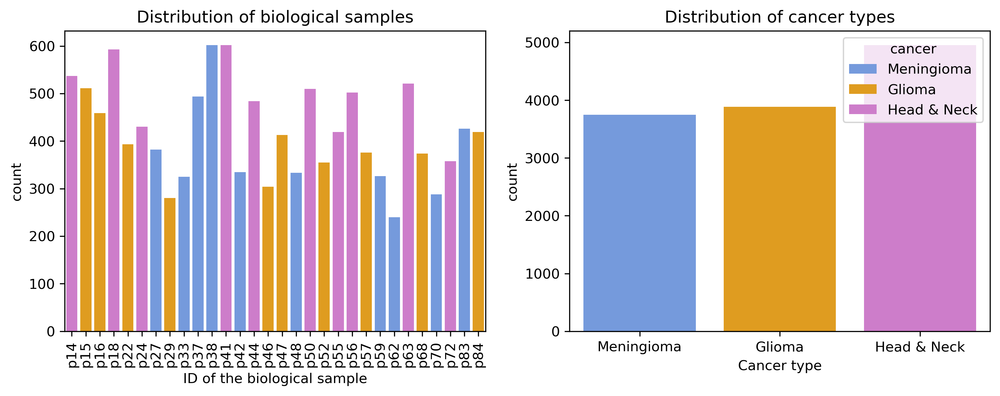

<IPython.core.display.Javascript object>

In [10]:
fig, ax = plt.subplots(figsize=[12, 4], ncols=2)
cancer_order = ["Meningioma", "Glioma", "Head & Neck"]
ax = ax.flatten()
ax[0] = sns.countplot(
    x="sample",
    data=all_data,
    ax=ax[0],
    order=np.unique(all_data.loc[:, "sample"]),
    hue_order=cancer_order,
    hue="cancer",
    dodge=False,
    palette=color_palette,
)
ax[0].legend([], [], frameon=False)
ax[0].set_xlabel("ID of the biological sample")
ax[0].set_title("Distribution of biological samples")
for tick in ax[0].get_xticklabels():
    tick.set_rotation(90)

ax[1] = sns.countplot(
    x="cancer",
    hue="cancer",
    data=all_data,
    ax=ax[1],
    order=cancer_order,
    dodge=False,
    palette=color_palette,
    hue_order=cancer_order,
)
ax[1].set_xlabel("Cancer type")
ax[1].set_title("Distribution of cancer types")

plt.show()
plt.close()

___

#### Subsampling

We next subsample the data set such that for each cancer type we have the same number of nuclei in the data set. Additionally, we ensure that for the individual cancer type population are approximately uniformly represented by the different biological (patient) samples.

In [11]:
sampled_data = get_stratified_data(
    all_data, id_column="id", cond_column="cancer", seed=1234
)

<IPython.core.display.Javascript object>

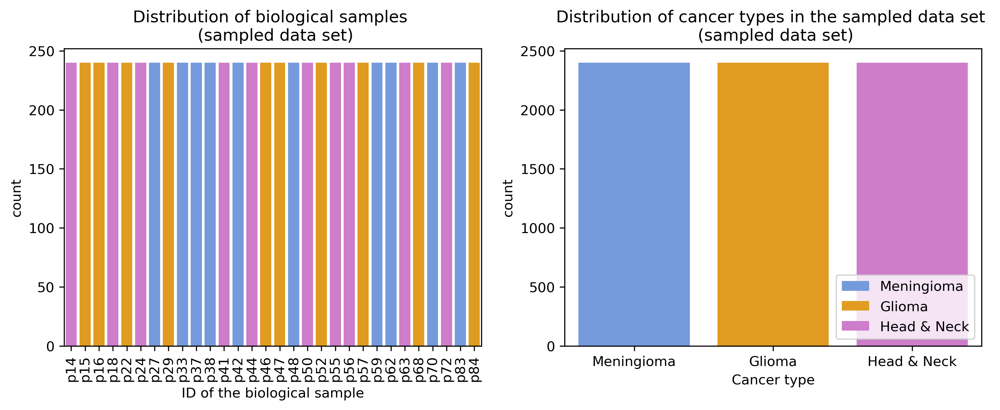

<IPython.core.display.Javascript object>

In [12]:
fig, ax = plt.subplots(figsize=[12, 4], ncols=2)
cancer_order = ["Meningioma", "Glioma", "Head & Neck"]
ax = ax.flatten()
ax[0] = sns.countplot(
    x="sample",
    data=sampled_data,
    ax=ax[0],
    order=np.unique(all_data.loc[:, "sample"]),
    hue_order=cancer_order,
    hue="cancer",
    dodge=False,
    palette=color_palette,
)
ax[0].legend([], [], frameon=False)
ax[0].set_xlabel("ID of the biological sample")
ax[0].set_title("Distribution of biological samples \n (sampled data set)")
for tick in ax[0].get_xticklabels():
    tick.set_rotation(90)

ax[1] = sns.countplot(
    x="cancer",
    hue="cancer",
    data=sampled_data,
    ax=ax[1],
    order=cancer_order,
    dodge=False,
    palette=color_palette,
    hue_order=cancer_order,
)
ax[1].set_xlabel("Cancer type")
ax[1].set_title(
    "Distribution of cancer types in the sampled data set \n (sampled data set)"
)
ax[1].legend(loc="lower right")

plt.show()
plt.close()

----

#### Sample and feature selection

We now filter out constant features and nuclei with missing features.

In [13]:
data = preprocess_data(sampled_data, remove_constant_features=True)

Nuclei that did not pass the quality check: 0/7200. Remaining: 7200.
Removed 28 constant or features with missing values. Remaining: 262.
Removed additional 0 features. Remaining: 262.


<IPython.core.display.Javascript object>

---

#### Data preparation

After sampling the data, we will now prepare the data for the consecutive analysis, i.e. extracting only chrometric features and corresponding metadata information.

In [14]:
all_chrometric_data = get_chrometric_data(
    data,
    proteins=["gh2ax", "lamin", "cd3"],
    exclude_dna_int=True,
)

sample_labels = data.loc[:, "sample"]
cancer_labels = data.loc[:, "cancer"]

<IPython.core.display.Javascript object>

Finally, we remove highly correlated features (Pearson $\rho > 0.8$) from the chrometric features.

In [15]:
chrometric_data = remove_correlated_features(all_chrometric_data, threshold=0.8)

Removed 138/194 features with a Pearson correlation above 0.8. Remaining: 56


<IPython.core.display.Javascript object>

---

## 3. Panels

Now we generate the individual panels for figure 3 of the paper.


### 3a. Visualization of changes of nuclear phenotypes in different cancer types

First, we provide a visual representation of the different nuclear phenotypes in health and cancer. To this end, we will randomly sample 36 nuclei from each of the three cancer types and plot a corresponding montage of the max-z projected DNA images. To visualize size differences each nuclei is padded to a size of 150x150 pixels. Note that the nuclei images were obtained from range-normalized DAPI images. The range normalization was used to mitigate batch effects.

In [16]:
image_file_path = "preprocessed/full_pipeline/segmentation/nuclei_images"
sampled_mg_images = get_random_images(
    data.loc[data.cancer == "Meningioma"],
    image_file_path,
    data_dir_col="data_dir",
    n_images=36,
    seed=1234,
    file_ending=".tif",
    file_name_col="file_name",
)

sampled_gl_images = get_random_images(
    data.loc[data.cancer == "Glioma"],
    image_file_path,
    data_dir_col="data_dir",
    n_images=36,
    seed=1234,
    file_ending=".tif",
    file_name_col="file_name",
)

sampled_hn_images = get_random_images(
    data.loc[data.cancer == "Head & Neck"],
    image_file_path,
    data_dir_col="data_dir",
    n_images=36,
    seed=1234,
    file_ending=".tif",
    file_name_col="file_name",
)

<IPython.core.display.Javascript object>

#### Meningioma population

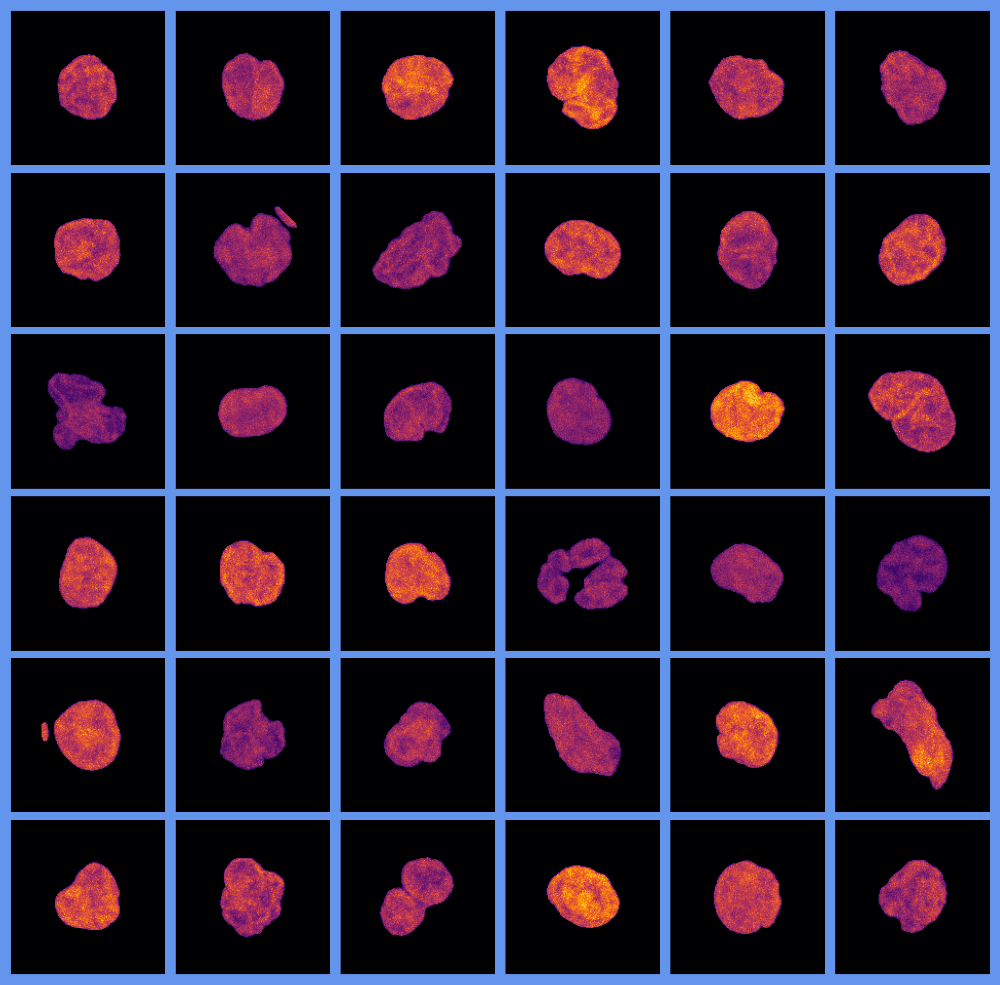

<IPython.core.display.Javascript object>

In [17]:
fig_mg, ax_mg = plot_montage(
    sampled_mg_images,
    pad_size=150,
    mask_nuclei=True,
    cmap="inferno",
    nrows=6,
    ncols=6,
)
fig_mg.set_facecolor(color_palette["Meningioma"])

#### Glioma population

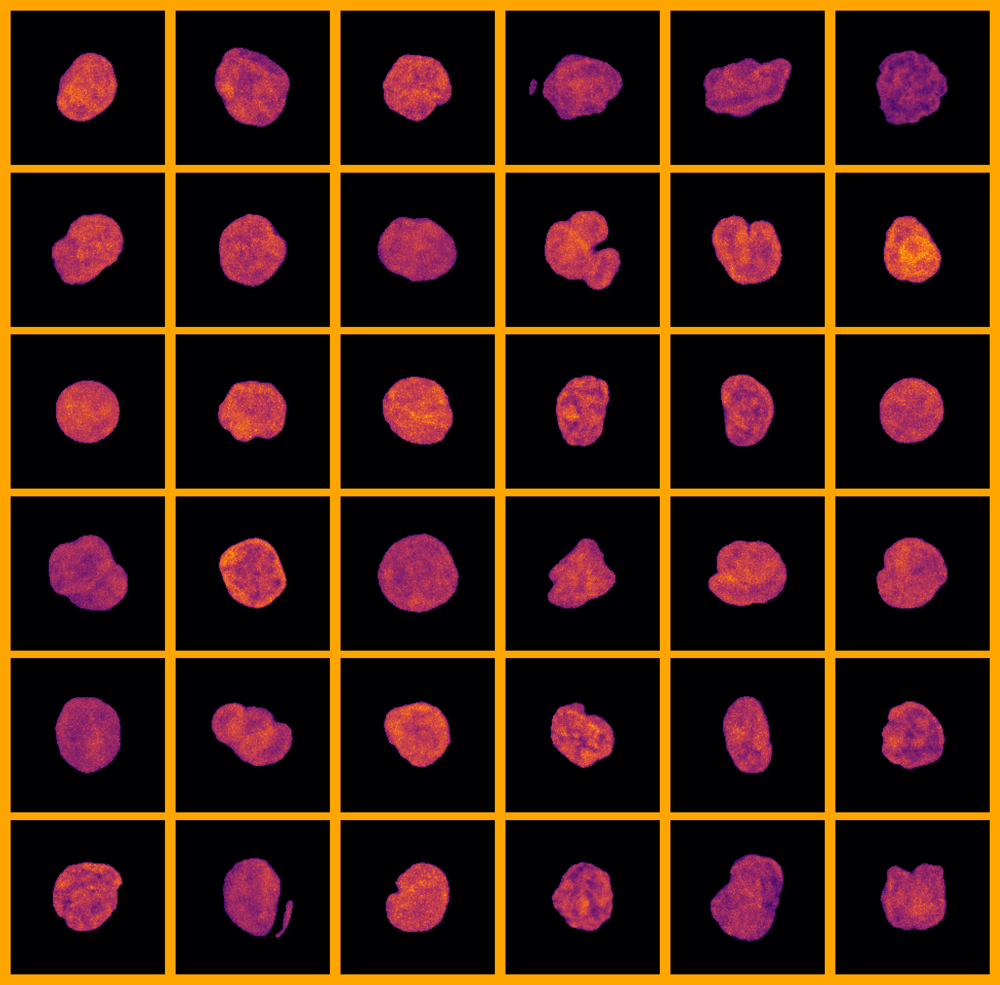

<IPython.core.display.Javascript object>

In [18]:
fig_gl, ax_gl = plot_montage(
    sampled_gl_images,
    pad_size=150,
    mask_nuclei=True,
    cmap="inferno",
    ncols=6,
    nrows=6,
)
fig_gl.set_facecolor(color_palette["Glioma"])

#### Head & Neck population

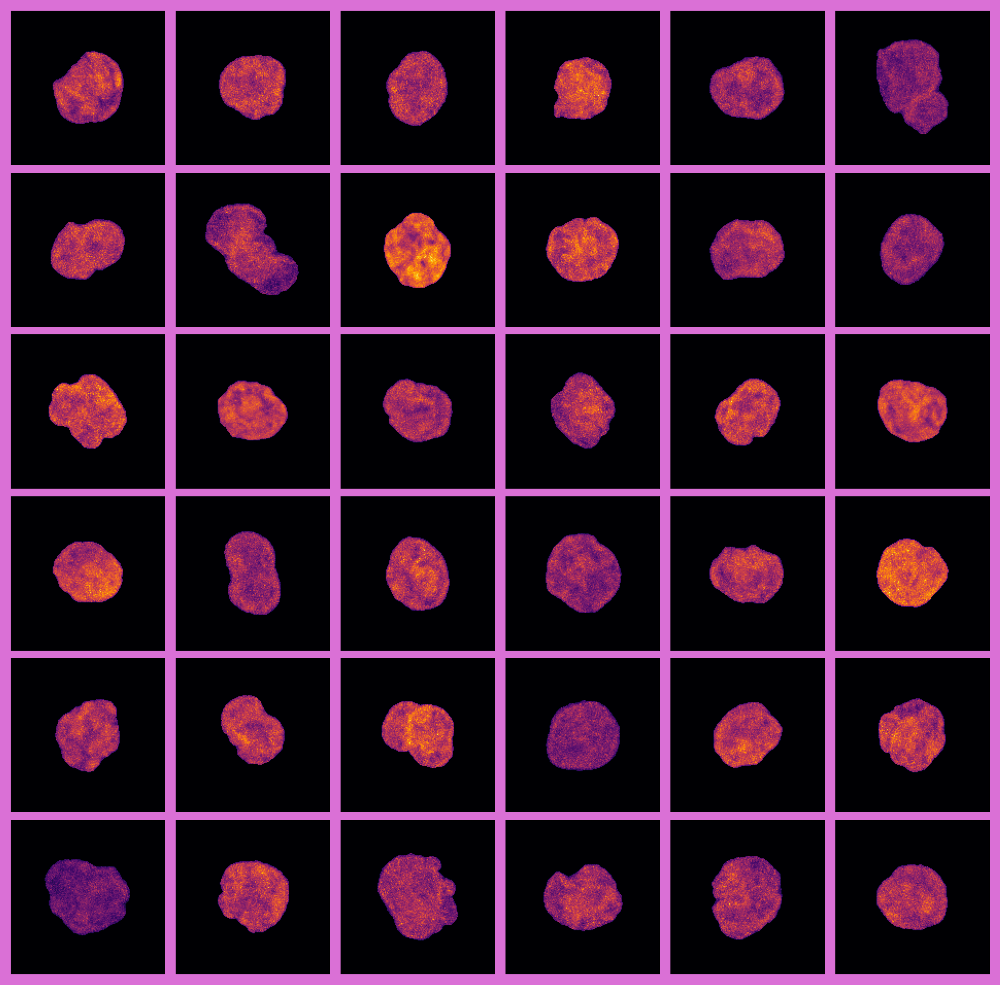

<IPython.core.display.Javascript object>

In [19]:
fig_hn, ax_hn = plot_montage(
    sampled_hn_images,
    pad_size=150,
    mask_nuclei=True,
    cmap="inferno",
    ncols=6,
    nrows=6,
)
fig_hn.set_facecolor(color_palette["Head & Neck"])

---

### 3b. Parametric analysis captures captures differences of PBMCs in the presence of Meningioma, Glioma and Head & Neck cancers

While the montage do not show large-scale differences between the different cancer types, we will now turn to the assessment of the parametric descriptions of the nuclear phenotypes of the PBMCs in those three cancer types. To this end, we first visualize the data set using a tSNE plot to assess potential large-scale differences between the cancer types and individual patient samples.

In [20]:
chrometric_embs = get_tsne_embs(chrometric_data)
chrometric_embs["cancer"] = np.array(cancer_labels)
chrometric_embs["sample"] = np.array(sample_labels)

/home/paysan_d/miniconda3/envs/icp/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:991: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


<IPython.core.display.Javascript object>

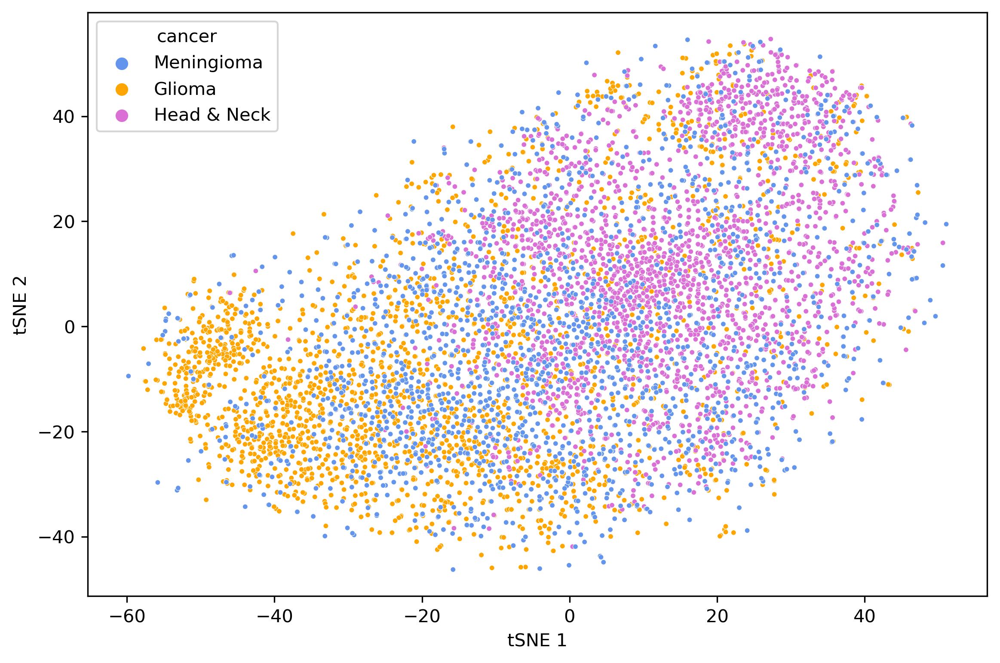

<IPython.core.display.Javascript object>

In [21]:
fig, ax = plt.subplots(figsize=[9, 6])
ax = sns.scatterplot(
    data=chrometric_embs,
    x="tSNE 1",
    y="tSNE 2",
    hue="cancer",
    hue_order=cancer_order,
    ax=ax,
    s=8,
    marker="o",
    palette=color_palette,
)
plt.show()

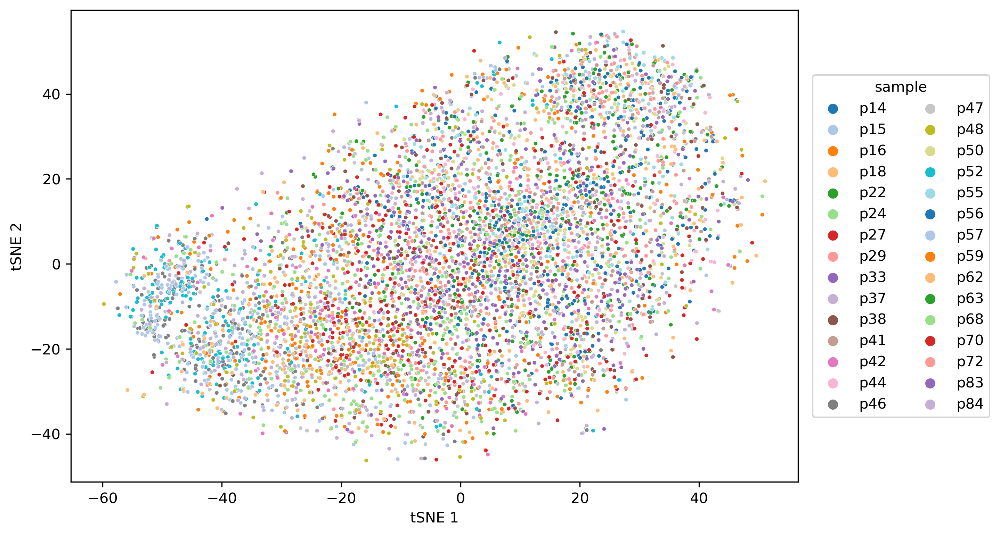

<IPython.core.display.Javascript object>

In [22]:
fig, ax = plt.subplots(figsize=[9, 6])
ax = sns.scatterplot(
    data=chrometric_embs,
    x="tSNE 1",
    y="tSNE 2",
    hue="sample",
    hue_order=np.unique(sample_labels),
    ax=ax,
    s=8,
    marker="o",
    palette="tab20",
)
plt.legend(
    bbox_to_anchor=(1.02, 0.5),
    loc="center left",
    borderaxespad=0,
    title="sample",
    ncol=2,
)
plt.show()

---

#### Classification of the different cancer types.

To quantify the separability of the three cancer types using the chrometric phenotypes of the PBMCs of the different cancer patients we perform a 10-fold stratified cross-validation analysis using a RandomForest classifier. The classifier provides a simple non-linear classification model which also yields an importance measure for the individual chrometric features indicating which ones are most different between the three populations.

##### Nuclei split

At first we will split the data randomly on a nuclei-basis, i.e. nuclei of the same patient will be likely included in both the training and the test sets.

In [23]:
rfc = RandomForestClassifier(
    n_estimators=500, n_jobs=10, random_state=seed, class_weight="balanced"
)

<IPython.core.display.Javascript object>

In [24]:
cancer_cv_conf_mtx_nuclei = get_cv_conf_mtx(
    estimator=rfc,
    features=chrometric_data,
    labels=cancer_labels,
    scale_features=False,
    n_folds=10,
    order=cancer_order,
)
normalized_cv_conf_mtx_nuclei = cancer_cv_conf_mtx_nuclei.divide(
    cancer_cv_conf_mtx_nuclei.sum(axis=1), axis=0
)

<IPython.core.display.Javascript object>

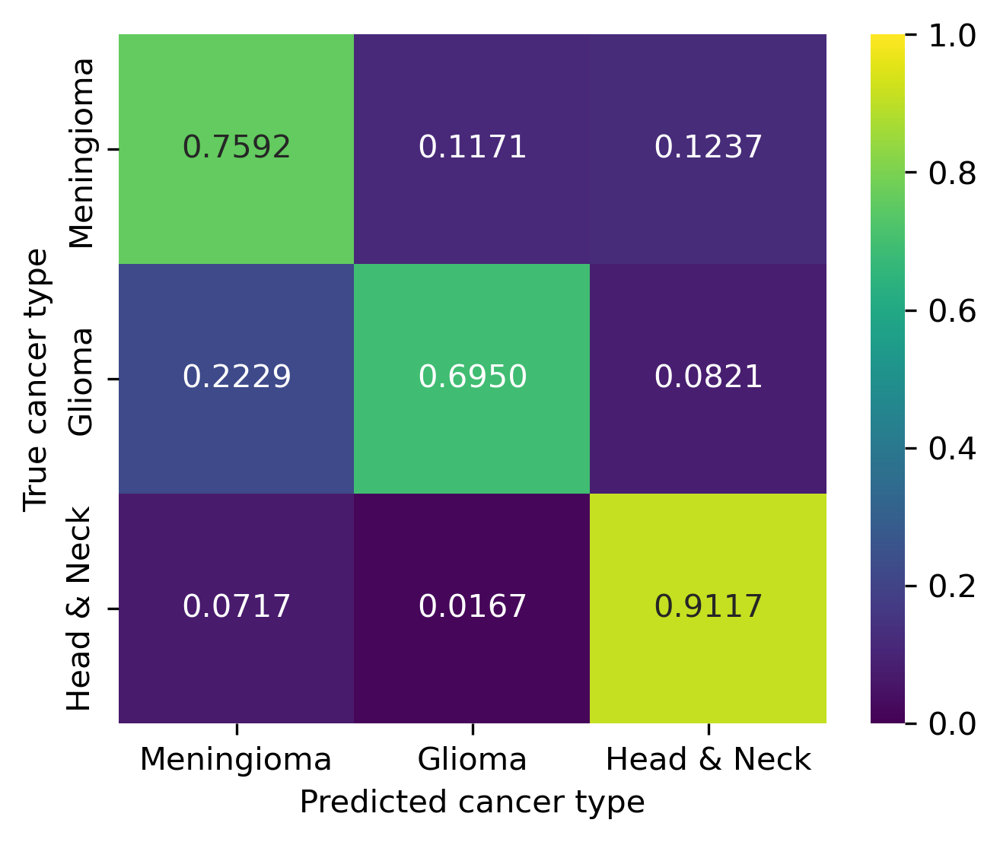

<IPython.core.display.Javascript object>

In [25]:
fig, ax = plt.subplots(figsize=[5, 4])
ax = sns.heatmap(
    normalized_cv_conf_mtx_nuclei,
    annot=True,
    fmt=".4f",
    cmap="viridis",
    vmin=0,
    vmax=1,
    # cbar=False,
)
ax.set_xlabel("Predicted cancer type")
ax.set_ylabel("True cancer type")
plt.show()

The classifier is able to accurately distinguish nuclei from the different cancer populations and it does particularly well on samples from the head&neck cancer population. The confusion matrix additionally backs the picture seen previously in the tSNE plot, where it seems as if the samples of the Meningioma patients feature phenotypes of both Head & Neck cancer and Gliomas as their distribution overlaps. PBMCs from Glioma patients are seen to be significantly more often confused with PBMCs from Meningioma patients suggesting that the chrometric phenotypes of those two cancer types is more similar when comparing e.g. Head & Neck cancers to Glioma and Meningioma. 

This is also reflected when we using a linear discriminant analysis to visualize the differences of the invidiual classes.

In [26]:
lda = LinearDiscriminantAnalysis(n_components=2)
lda_cancer_cv_conf_mtx_nuclei = get_cv_conf_mtx(
    estimator=lda,
    features=chrometric_data,
    labels=cancer_labels,
    scale_features=True,
    n_folds=10,
    order=cancer_order,
)
lda_normalized_cv_conf_mtx_nuclei = lda_cancer_cv_conf_mtx_nuclei.divide(
    lda_cancer_cv_conf_mtx_nuclei.sum(axis=1), axis=0
)

<IPython.core.display.Javascript object>

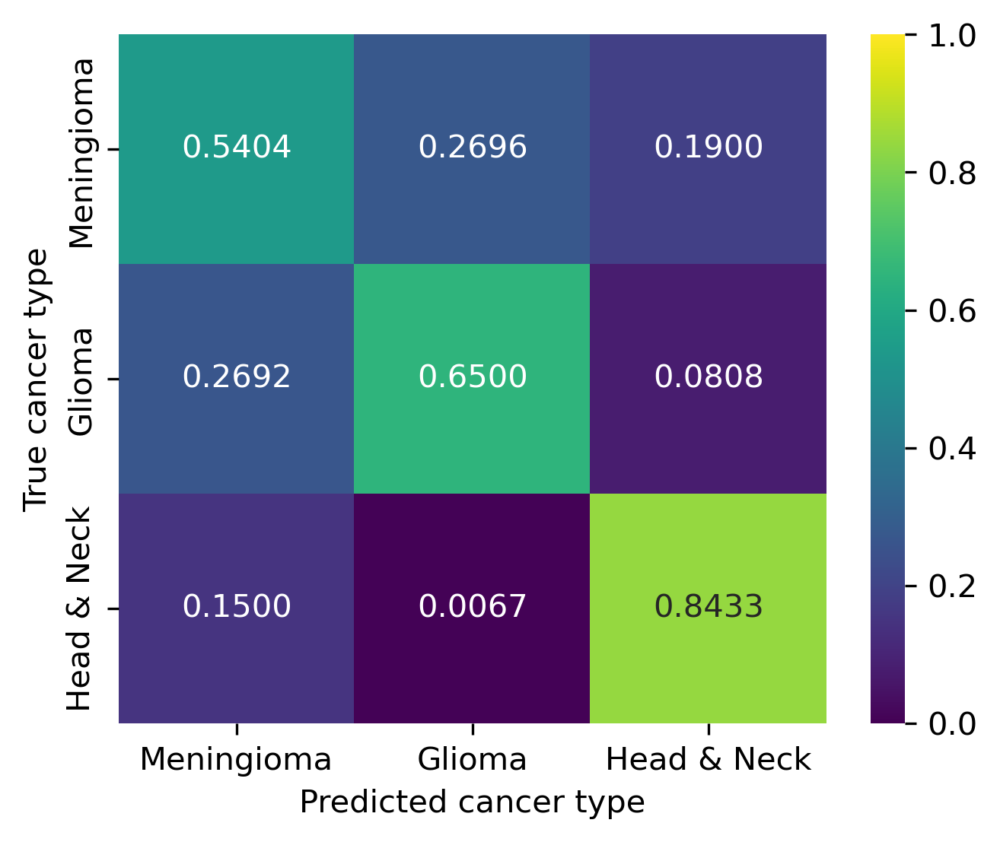

<IPython.core.display.Javascript object>

In [27]:
fig, ax = plt.subplots(figsize=[5, 4])
ax = sns.heatmap(
    lda_normalized_cv_conf_mtx_nuclei,
    annot=True,
    fmt=".4f",
    cmap="viridis",
    vmin=0,
    vmax=1,
    # cbar=False,
)
ax.set_xlabel("Predicted cancer type")
ax.set_ylabel("True cancer type")
plt.show()

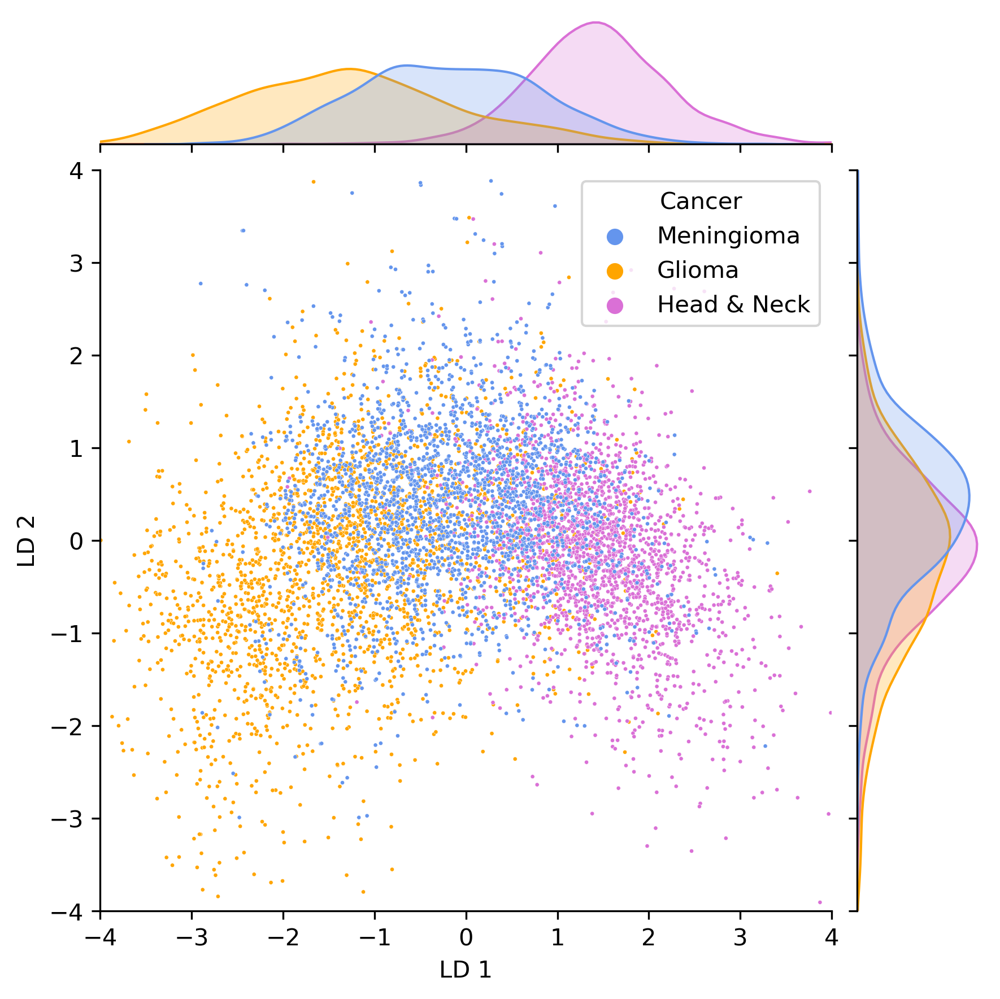

<IPython.core.display.Javascript object>

In [28]:
lda_transformed = pd.DataFrame(
    lda.fit(chrometric_data, cancer_labels).transform(chrometric_data),
    columns=["LD 1", "LD 2"],
    index=chrometric_data.index,
)
lda_transformed["cancer"] = np.array(cancer_labels)
lda_transformed["sample"] = np.array(sample_labels)
g = sns.jointplot(
    data=lda_transformed,
    x="LD 1",
    y="LD 2",
    hue="cancer",
    s=3,
    hue_order=cancer_order,
    height=6,
    palette=color_palette,
    xlim=[-4, 4],
    ylim=[-4, 4],
)
g.ax_joint.legend(title="Cancer")

In [29]:
not_plotted = (
    np.sum(lda_transformed.loc[:, "LD 1"] > 4)
    + np.sum(lda_transformed.loc[:, "LD 1"] < -4)
    + np.sum(lda_transformed.loc[:, "LD 2"] > 4)
    + np.sum(lda_transformed.loc[:, "LD 2"] < -4)
)
print(
    "{} nuclei of a total {} are not shown in the LDA plot.".format(
        not_plotted, len(lda_transformed)
    )
)

52 nuclei of a total 7200 are not shown in the LDA plot.


<IPython.core.display.Javascript object>

---
#### Patient split


While the previous analysis assess the level of differences of the chrometric phenotypes of the PBMCs between the different cancer types, the classifier can make use of patient specific characteristics during the classification. In a diagnostic use case such information would not be available. To evaluate how well a classifier would be able to predict for unseen patient the corresponding cancer type simply based on the chrometric phenotypes of the PBMCs, we also assess the class separability using a stratified 10-fold patient-cross-validation approach. Thereby at each iteration 1 of the patients of each cancer type are hold out for the test set.

In [30]:
cancer_cv_conf_mtx_patient = get_cv_conf_mtx(
    estimator=rfc,
    features=chrometric_data,
    labels=cancer_labels,
    groups=sample_labels,
    scale_features=False,
    n_folds=10,
    order=cancer_order,
)
normalized_cv_conf_mtx_patient = cancer_cv_conf_mtx_patient.divide(
    cancer_cv_conf_mtx_patient.sum(axis=1), axis=0
)

<IPython.core.display.Javascript object>

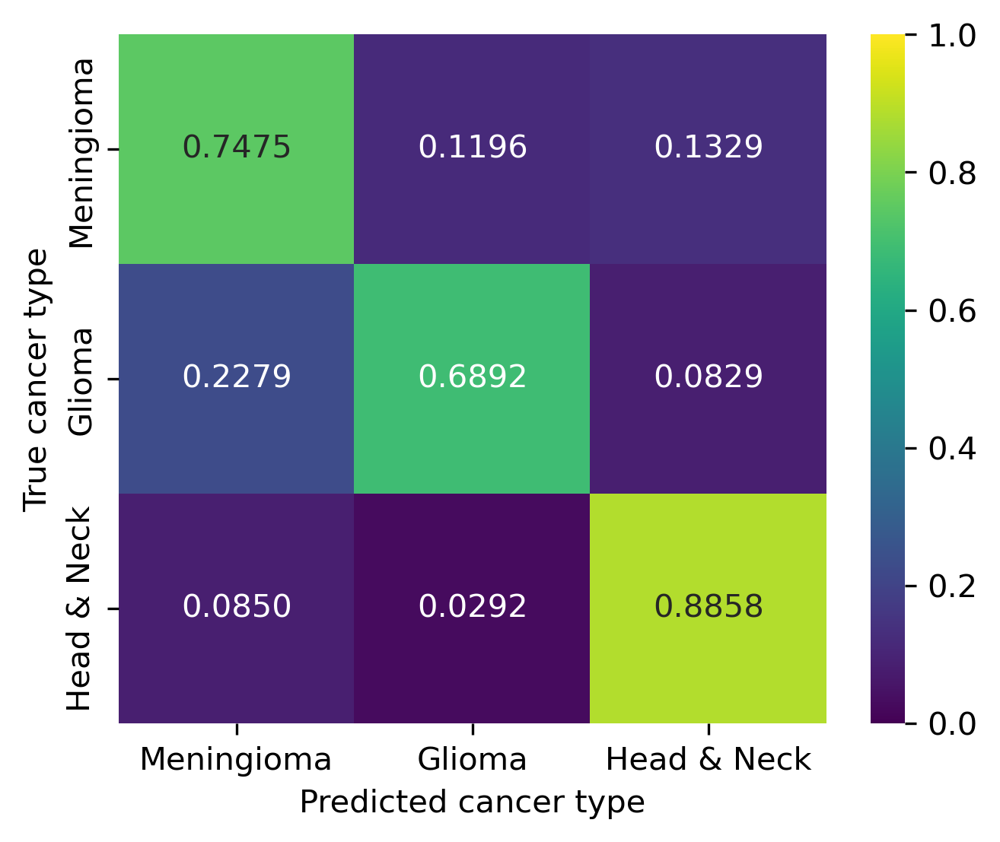

<IPython.core.display.Javascript object>

In [31]:
fig, ax = plt.subplots(figsize=[5, 4])
ax = sns.heatmap(
    normalized_cv_conf_mtx_patient,
    annot=True,
    fmt=".4f",
    cmap="viridis",
    vmin=0,
    vmax=1,
    # cbar=False,
)
ax.set_xlabel("Predicted cancer type")
ax.set_ylabel("True cancer type")
plt.show()

In general the confusion matrix again shows a similar picture as seen for the nuclei-based split showing that Head & Neck cancer patients show phenotypes of the PBMCs significantly different from the other two cancer types.

---

### 3c. Nuclear chromatin biomarkers identifying cancer populations

#### Feature importance

After having validated that there are significant differences between the individual cancer types in particular when comparing PBMCs of Head & Neck cancer patient with those of Glioma and Meningioma patients, we next assess the implicit feature importance of a RandomForest classifier trained on the task to distinguish between the cancer types in order to get an idea of the features which are most indicative of the different cancer types.

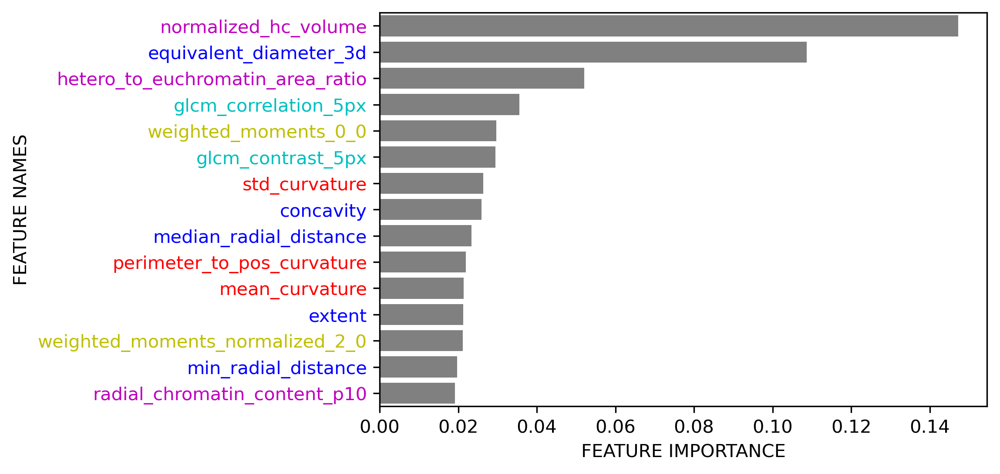

<IPython.core.display.Javascript object>

In [32]:
fig, ax = plot_feature_importance_for_estimator(
    rfc,
    chrometric_data,
    cancer_labels,
    scale_features=False,
    cmap=["gray"],
    figsize=[6, 4],
    feature_color_dict=feature_color_dict,
    n_features=15,
)

The analysis suggests that the heterochromatin content as well as the size of the nucleus are most discriminative between the different cancer populations in addition to a number of features characterizing the shape of the intensity distribution of the DNA inside the nucleus in 2D.

While the previously shown feature importance plots already suggest a number of candidate chrometric biomarkers that capture the differences of the nuclear phenotypes of the PBMCs in the different cancer types, we run marker screen by testing for differential distributions of the individual chrometric features between the different cancer type populations. To this end, we apply a t-test to test for difference in the means and adjust for multiple testing using the Benjamini-Hochberg procedure.

In [33]:
marker_screen_results = find_markers(chrometric_data, cancer_labels)

Run marker screen:   0%|          | 0/3 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

#### Meningioma

At first we look at the features whose mean is significantly different in Meningioma patients compared to patients of the other two cancer types.

In [34]:
marker_screen_results.loc[marker_screen_results.label == "Meningioma"].head(10)

,label,marker,fc,abs_delta_fc,pval,pval_adjust
4,Meningioma,median_radial_distance,0.973555,0.026445,1.686172e-61,1.416385e-60
7,Meningioma,mean_curvature,1.031861,0.031861,1.235275e-43,6.485194e-43
0,Meningioma,min_caliper_distance,0.972358,0.027642,1.763562e-36,8.465097e-36
51,Meningioma,equivalent_diameter_3d,0.986782,0.013218,3.876460e-32,1.760123e-31
19,Meningioma,homogeneity_100,0.517908,0.482092,1.265431e-29,4.944009e-29
1,Meningioma,max_caliper_distance,0.978167,0.021833,3.012253e-23,1.076720e-22
9,Meningioma,num_polarity_changes,0.951856,0.048144,4.926615e-23,1.724315e-22
10,Meningioma,length_pos_curvature,0.980088,0.019912,3.090836e-20,1.038521e-19
21,Meningioma,glcm_correlation_25px,-2.913563,3.913563,1.261714e-17,3.999396e-17
14,Meningioma,perimeter_to_pos_curvature,1.012860,0.012860,3.021808e-17,9.401180e-17


<IPython.core.display.Javascript object>

We find that the PBMCs of Meningioma patients are on average slighlty smaller compared to the other two cancer types and show a slightly higher curvature of the nuclear boundaries.

---

#### Glioma

Next we look at the features whose mean is significantly different in Glioma patients compared to patients of the other two cancer types.

In [35]:
marker_screen_results.loc[marker_screen_results.label == "Glioma"].head(10)

,label,marker,fc,abs_delta_fc,pval,pval_adjust
51,Glioma,equivalent_diameter_3d,0.953767,0.046233,0.000000e+00,0.000000e+00
54,Glioma,normalized_hc_volume,0.895398,0.104602,0.000000e+00,0.000000e+00
16,Glioma,hetero_to_euchromatin_area_ratio,0.855724,0.144276,9.559575e-283,2.676681e-281
22,Glioma,weighted_moments_0_0,1.146908,0.146908,3.555804e-164,7.467188e-163
20,Glioma,glcm_correlation_5px,1.052380,0.052380,2.332604e-156,4.354193e-155
8,Glioma,std_curvature,0.865302,0.134698,1.796509e-116,2.515112e-115
52,Glioma,extent,1.053488,0.053488,3.292263e-80,3.253531e-79
3,Glioma,min_radial_distance,1.067807,0.067807,3.006536e-64,2.658411e-63
5,Glioma,concavity,0.778579,0.221421,6.519842e-61,5.215873e-60
55,Glioma,radial_chromatin_content_p10,1.698502,0.698502,2.432210e-55,1.702547e-54


<IPython.core.display.Javascript object>

Not surprisingly we find that the most indicative features are the similar ones as suggested by the feature importance plot. We find that the PBMCs of Glioma patients have a significantly reduced HC/EC content compared to the other cancer types and also are on average smaller, where as their nuclear boundaries show smoother curvature changes and the intensity distribution of the DNA inside the nucleus is more skewed and features shorter tails on average. Additionally the projected nuclear shapes are on average more convex compared to the other two cancer types.

---

#### Head & Neck cancers

Finally, we also evaluate the chrometric phenotype of PBMCs of the Head & Neck cancer patients.

In [36]:
marker_screen_results.loc[marker_screen_results.label == "Head & Neck"].head(10)

,label,marker,fc,abs_delta_fc,pval,pval_adjust
16,Head & Neck,hetero_to_euchromatin_area_ratio,1.191437,0.191437,0.000000e+00,0.000000e+00
54,Head & Neck,normalized_hc_volume,1.122582,0.122582,0.000000e+00,0.000000e+00
51,Head & Neck,equivalent_diameter_3d,1.061467,0.061467,0.000000e+00,0.000000e+00
8,Head & Neck,std_curvature,1.200055,0.200055,9.430700e-166,2.263368e-164
22,Head & Neck,weighted_moments_0_0,0.897561,0.102439,9.415202e-139,1.581754e-137
14,Head & Neck,perimeter_to_pos_curvature,0.964922,0.035078,1.680104e-118,2.565977e-117
20,Head & Neck,glcm_correlation_5px,0.954835,0.045165,5.301618e-114,6.851322e-113
12,Head & Neck,num_prominant_pos_curvature,1.167967,0.167967,5.248443e-102,6.298132e-101
13,Head & Neck,num_prominant_neg_curvature,1.203079,0.203079,1.373648e-93,1.538486e-92
52,Head & Neck,extent,0.946150,0.053850,6.664503e-87,6.997728e-86


<IPython.core.display.Javascript object>

The PBMCs of the Head & Neck cancer patients feature have on average an increase heterochromatin content, are enlarged and show larger changes of the curvature of the nuclear boundaries, while the kurtosis and the skewness of the DNA intensity distribution is significantly reduced in both cases.

---

As a joint proxy to study the alterations in size, we focus at the nuclear volume, the variation in the shape by the concavity of the nucleus and the change in chromatin compaction by the relative heterochromatin to euchromatin ratio, additionally we observe differences in the curvature. Finally, the shape of the DNA intensity distributions of the z-projected nucleus are significantly different. To visualize those differences, we look at the distributions of those markers in the different cancer types.

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Glioma vs. Head & Neck: t-test independent samples with Benjamini-Hochberg correction, P_val:0.000e+00 t=-5.504e+01
Meningioma vs. Glioma: t-test independent samples with Benjamini-Hochberg correction, P_val:2.416e-79 t=1.922e+01
Meningioma vs. Head & Neck: t-test independent samples with Benjamini-Hochberg correction, P_val:7.726e-303 t=-4.005e+01


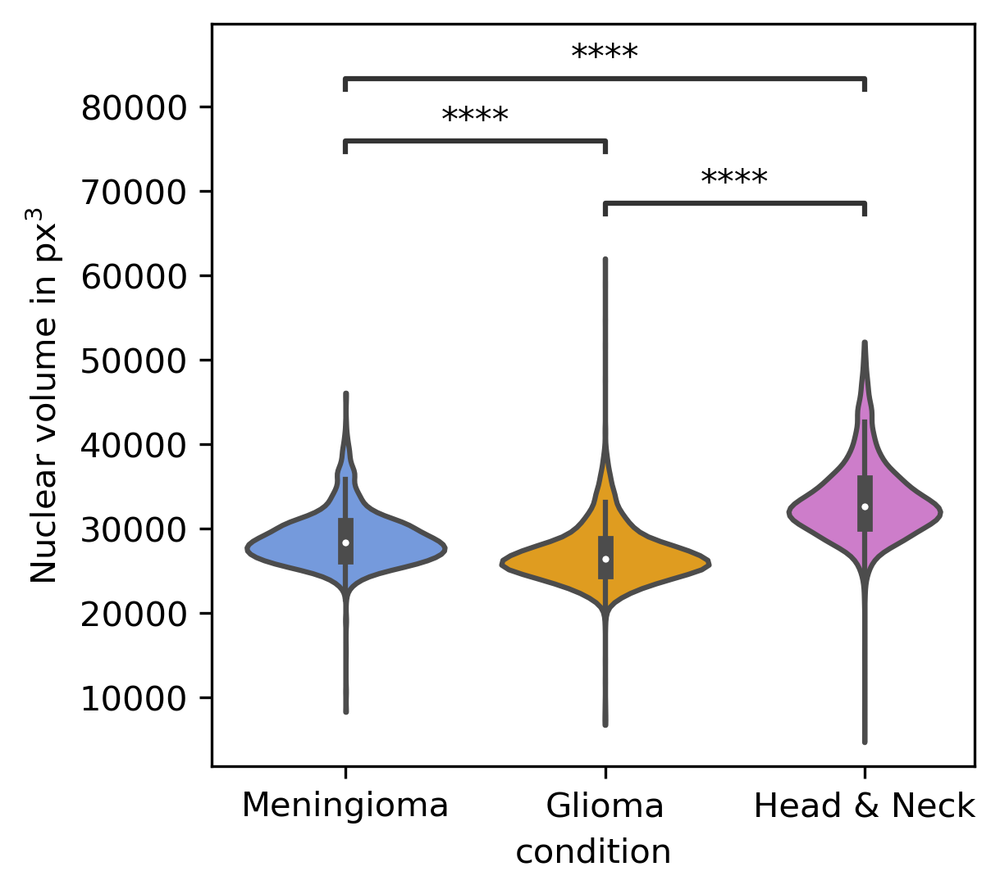

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Glioma vs. Head & Neck: t-test independent samples with Benjamini-Hochberg correction, P_val:0.000e+00 t=-7.321e+01
Meningioma vs. Glioma: t-test independent samples with Benjamini-Hochberg correction, P_val:2.030e-148 t=2.688e+01
Meningioma vs. Head & Neck: t-test independent samples with Benjamini-Hochberg correction, P_val:0.000e+00 t=-5.205e+01


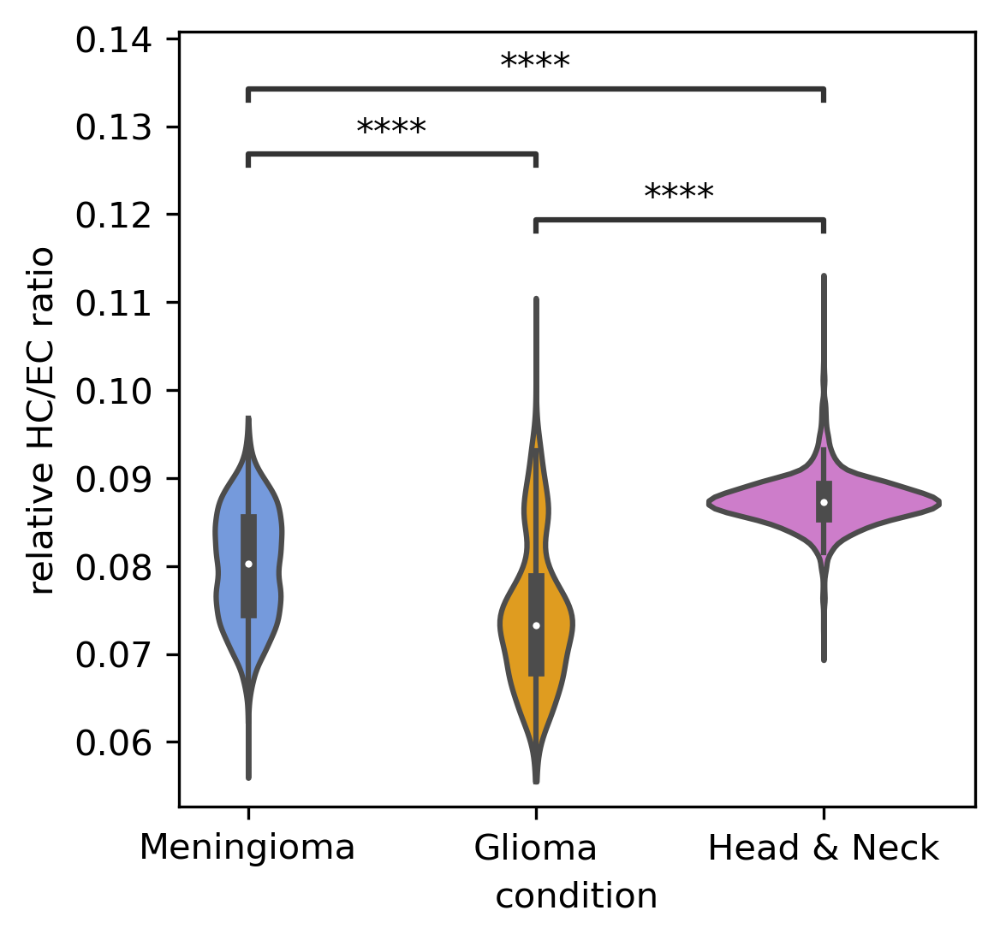

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Glioma vs. Head & Neck: t-test independent samples with Benjamini-Hochberg correction, P_val:3.845e-184 t=-3.025e+01
Meningioma vs. Glioma: t-test independent samples with Benjamini-Hochberg correction, P_val:4.940e-21 t=9.455e+00
Meningioma vs. Head & Neck: t-test independent samples with Benjamini-Hochberg correction, P_val:1.033e-94 t=-2.112e+01


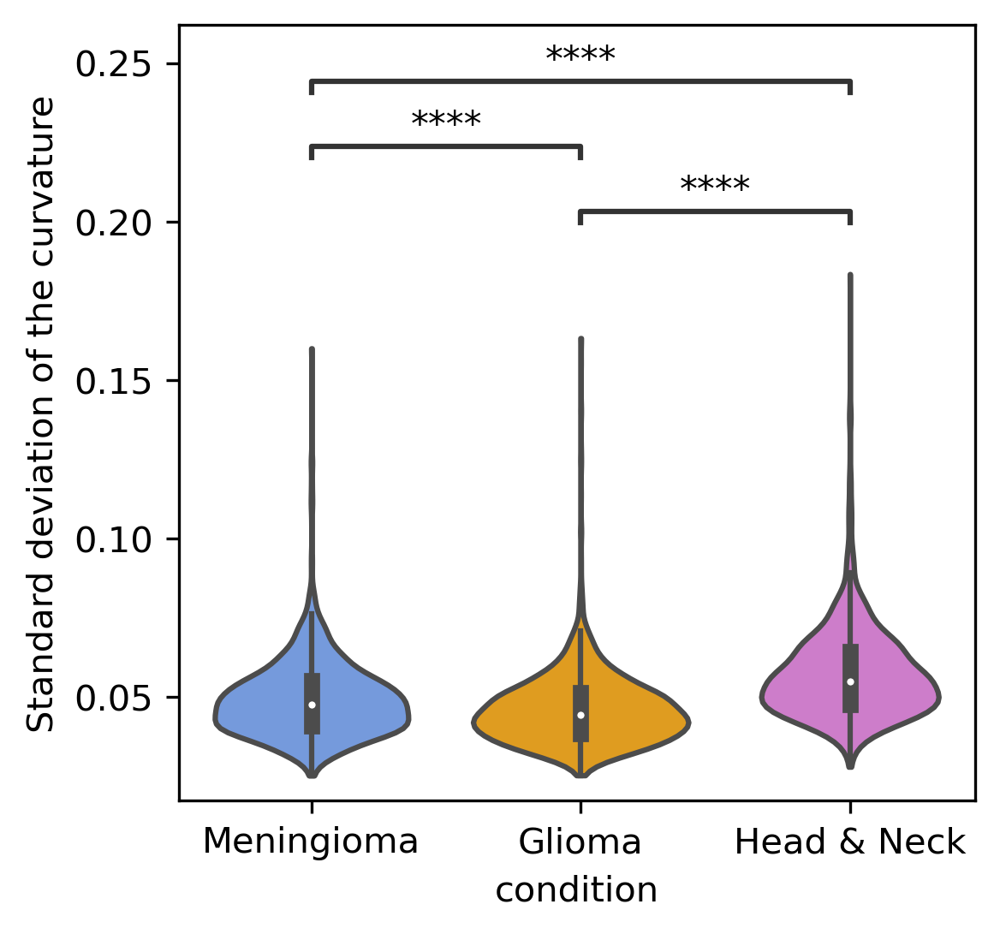

<IPython.core.display.Javascript object>

In [37]:
markers = [
    "volume",
    "hetero_to_euchromatin_volume_ratio",
    "std_curvature",
]

marker_labels = [
    r"Nuclear volume in px$^3$",
    "relative HC/EC ratio",
    "Standard deviation of the curvature",
]
plot_cancer_type_markers_dist(
    data, markers, marker_labels, cut=0, palette=color_palette, figsize=[4, 4]
)

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Glioma vs. Head & Neck: t-test independent samples with Benjamini-Hochberg correction, P_val:0.000e+00 t=-5.504e+01
Meningioma vs. Glioma: t-test independent samples with Benjamini-Hochberg correction, P_val:2.416e-79 t=1.922e+01
Meningioma vs. Head & Neck: t-test independent samples with Benjamini-Hochberg correction, P_val:7.726e-303 t=-4.005e+01


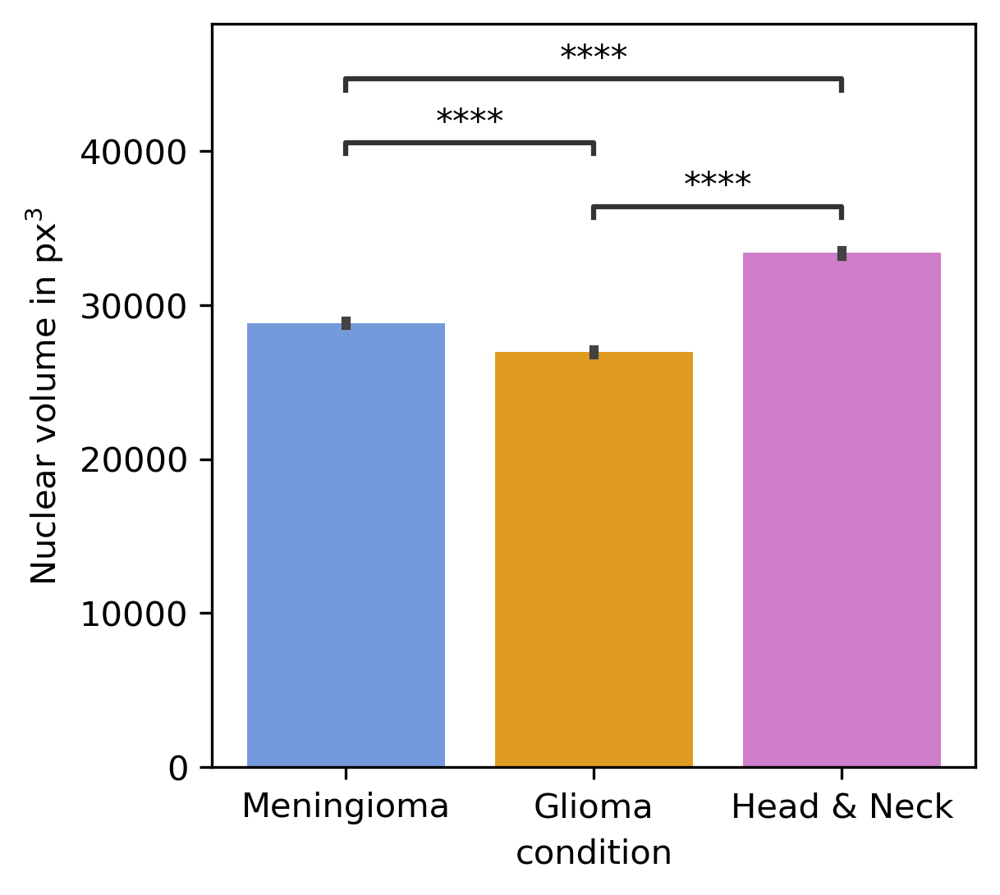

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Glioma vs. Head & Neck: t-test independent samples with Benjamini-Hochberg correction, P_val:0.000e+00 t=-7.321e+01
Meningioma vs. Glioma: t-test independent samples with Benjamini-Hochberg correction, P_val:2.030e-148 t=2.688e+01
Meningioma vs. Head & Neck: t-test independent samples with Benjamini-Hochberg correction, P_val:0.000e+00 t=-5.205e+01


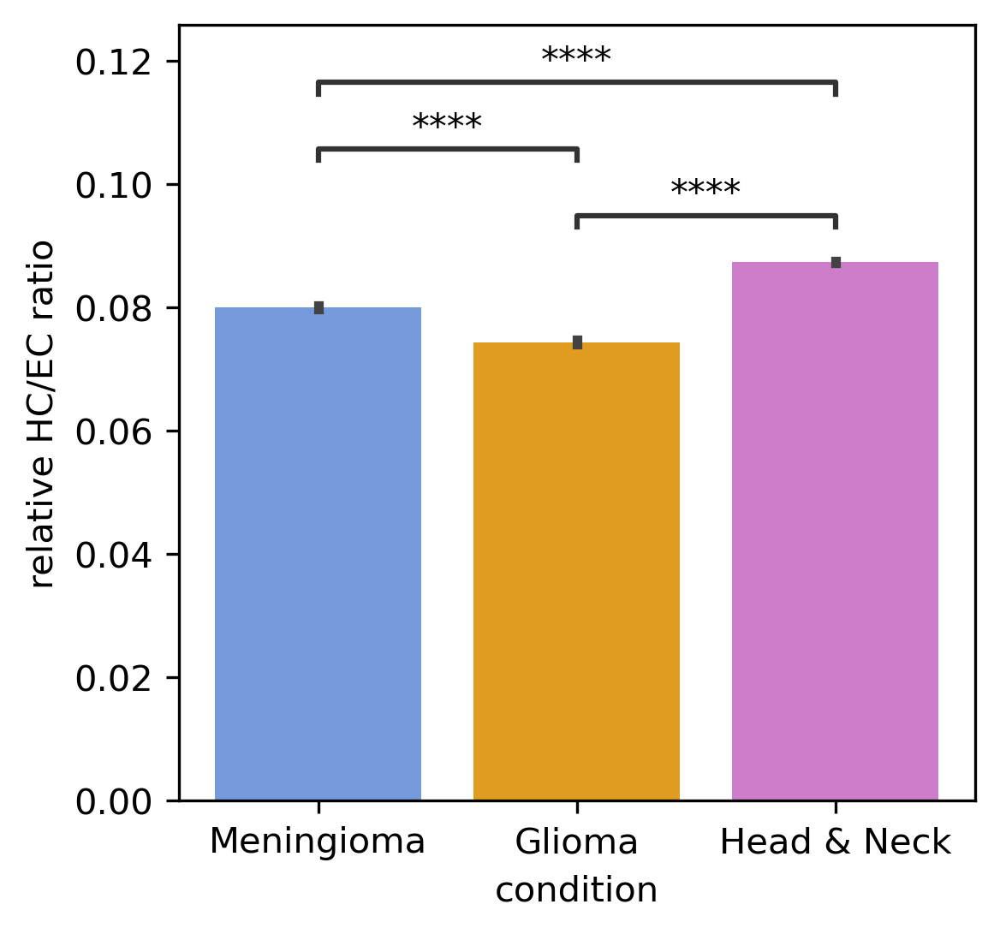

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Glioma vs. Head & Neck: t-test independent samples with Benjamini-Hochberg correction, P_val:3.845e-184 t=-3.025e+01
Meningioma vs. Glioma: t-test independent samples with Benjamini-Hochberg correction, P_val:4.940e-21 t=9.455e+00
Meningioma vs. Head & Neck: t-test independent samples with Benjamini-Hochberg correction, P_val:1.033e-94 t=-2.112e+01


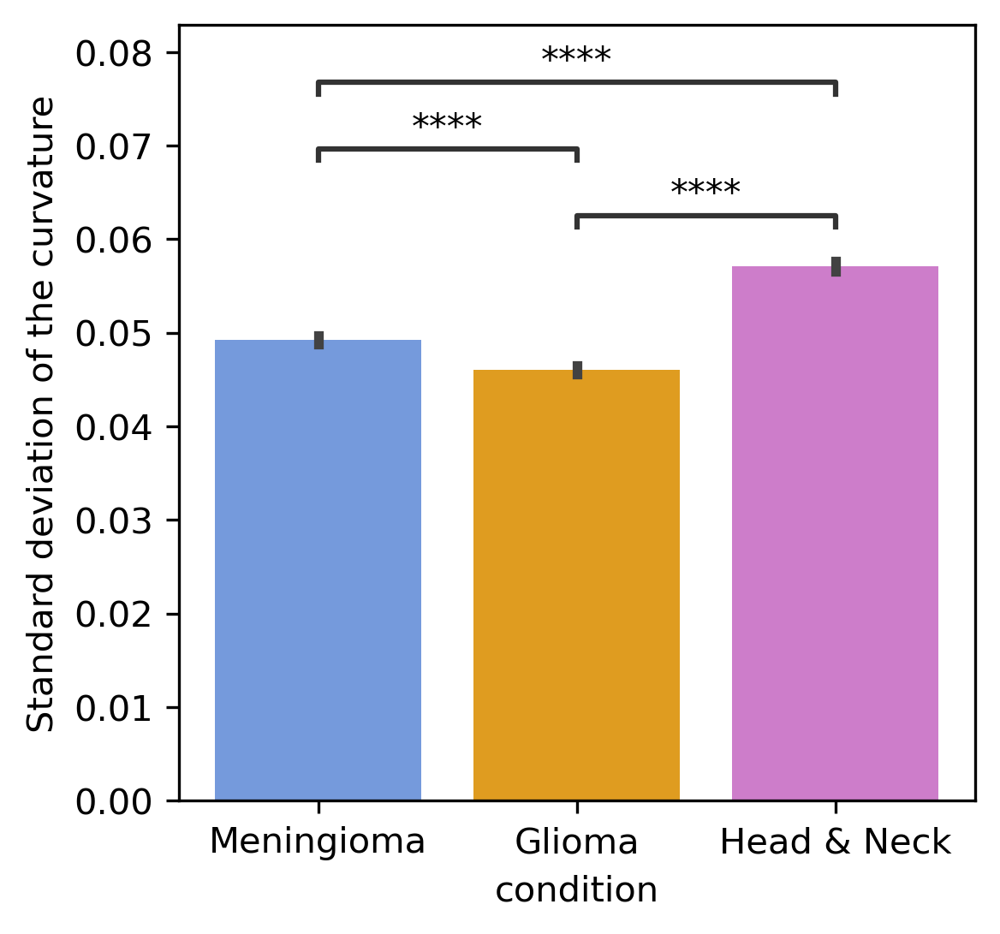

<IPython.core.display.Javascript object>

In [38]:
plot_cancer_type_markers_dist(
    data, markers, marker_labels, cut=0, plot_type="bar", palette=color_palette
)

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

HC/EC ratio_Glioma vs. HC/EC ratio_Head & Neck: Welch's t-test independent samples with Benjamini-Hochberg correction, P_val:0.000e+00 t=-7.321e+01
Standard deviation 
 of the curvature_Meningioma vs. Standard deviation 
 of the curvature_Glioma: Welch's t-test independent samples with Benjamini-Hochberg correction, P_val:4.945e-21 t=9.455e+00
Standard deviation 
 of the curvature_Glioma vs. Standard deviation 
 of the curvature_Head & Neck: Welch's t-test independent samples with Benjamini-Hochberg correction, P_val:1.416e-183 t=-3.025e+01
HC/EC ratio_Meningioma vs. HC/EC ratio_Glioma: Welch's t-test independent samples with Benjamini-Hochberg correction, P_val:9.550e-148 t=2.688e+01
Nuclear volume 
(in px$^3)$_Meningioma vs. Nuclear volume 
(in px$^3)$_Glioma: Welch's t-test independent samples with Benjam

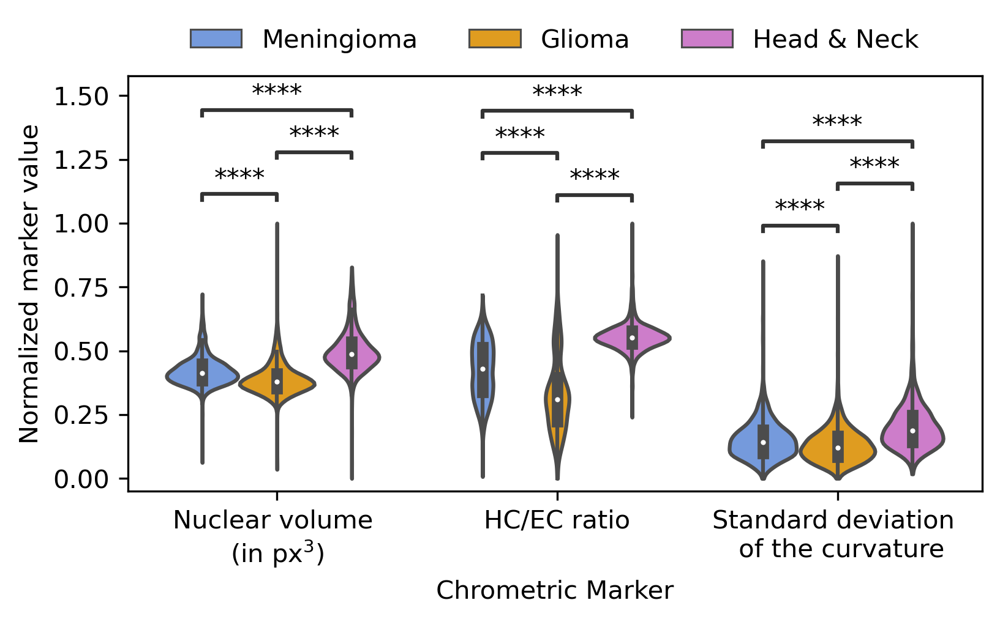

<IPython.core.display.Javascript object>

In [39]:
marker_labels = [
    "Nuclear volume \n" + r"(in px$^3)$",
    "HC/EC ratio",
    "Standard deviation \n of the curvature",
]
fig, ax = plot_joint_markers_cancer_types(
    data, markers, marker_labels, label_col="cancer", palette=color_palette
)
ax.set_ylabel("Normalized marker value")
ax.set_xlabel("Chrometric Marker")
sns.move_legend(
    ax,
    "lower center",
    bbox_to_anchor=(0.5, 1),
    ncol=3,
    title=None,
    frameon=False,
)
plt.show()

---

### 3d. Proteomic differences of PBMCs in cancer

Finally, we also assess the proteomic differences between the different cancer populations. To this end, we plot the relative Lamin and gH2AX expression measured by the sum of the intensities of the corresponding imaging channels normalized by the nuclear volume. Additionally, we plot the number of identified gH2AX foci which are computed as the local maxima peaks found in the corresponding channel images.

Note that those features are only available for the first data set that was stained for those proteins.

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Glioma vs. Head & Neck: t-test independent samples with Benjamini-Hochberg correction, P_val:9.095e-03 t=2.610e+00
Meningioma vs. Glioma: t-test independent samples with Benjamini-Hochberg correction, P_val:3.735e-09 t=-5.907e+00
Meningioma vs. Head & Neck: t-test independent samples with Benjamini-Hochberg correction, P_val:9.225e-03 t=-2.605e+00


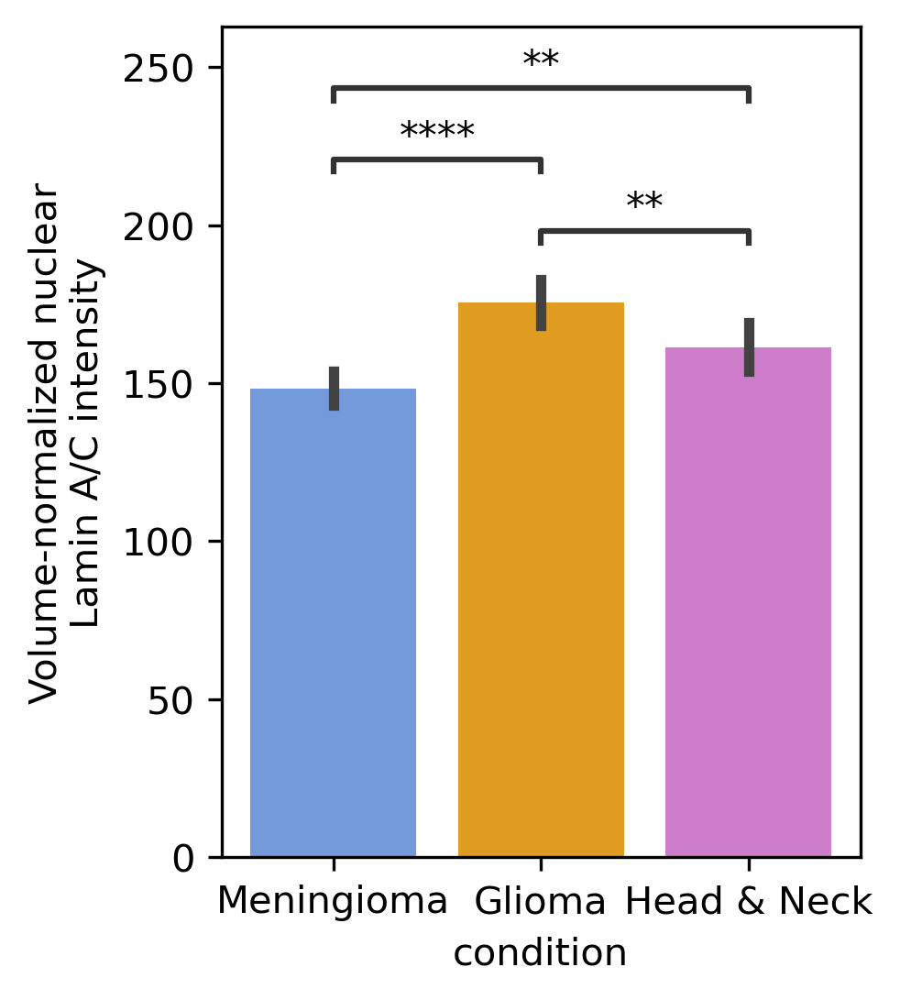

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Glioma vs. Head & Neck: t-test independent samples with Benjamini-Hochberg correction, P_val:3.263e-91 t=2.070e+01
Meningioma vs. Glioma: t-test independent samples with Benjamini-Hochberg correction, P_val:2.160e-28 t=-1.112e+01
Meningioma vs. Head & Neck: t-test independent samples with Benjamini-Hochberg correction, P_val:1.773e-17 t=8.540e+00


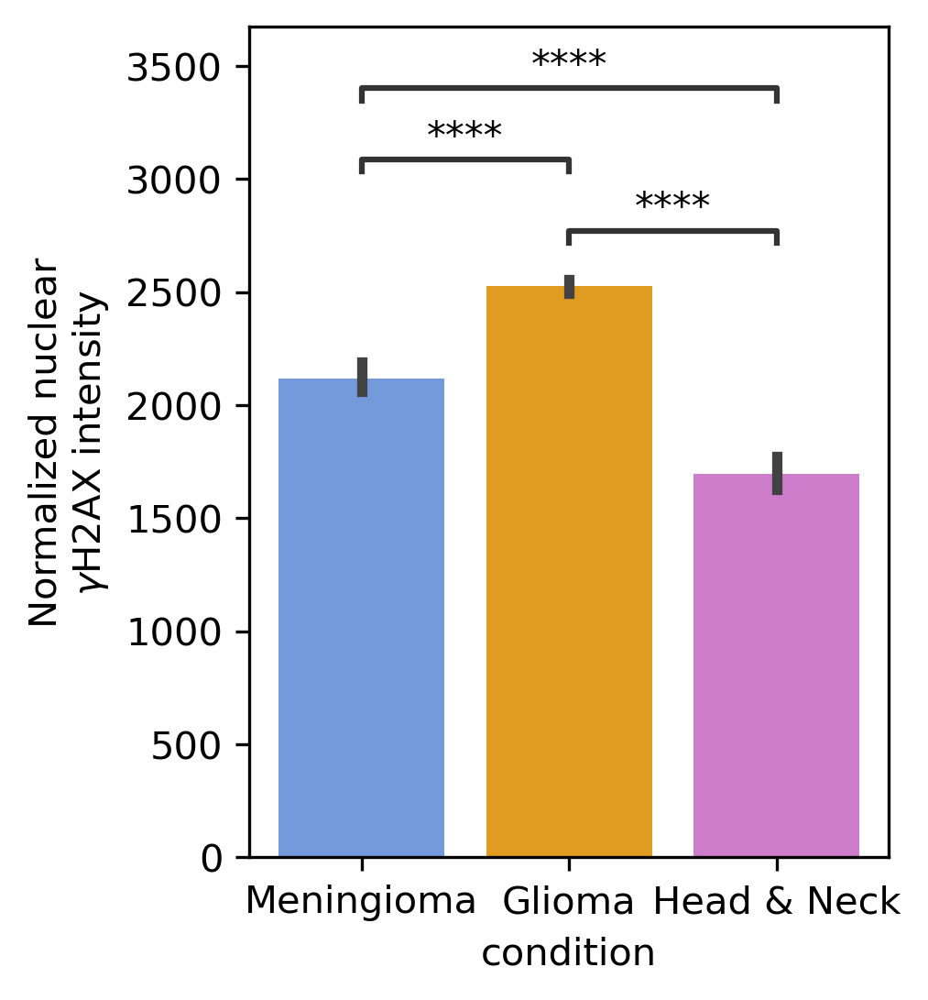

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Glioma vs. Head & Neck: t-test independent samples with Benjamini-Hochberg correction, P_val:3.334e-26 t=-1.065e+01
Meningioma vs. Glioma: t-test independent samples with Benjamini-Hochberg correction, P_val:2.399e-01 t=1.175e+00
Meningioma vs. Head & Neck: t-test independent samples with Benjamini-Hochberg correction, P_val:9.329e-22 t=-9.631e+00


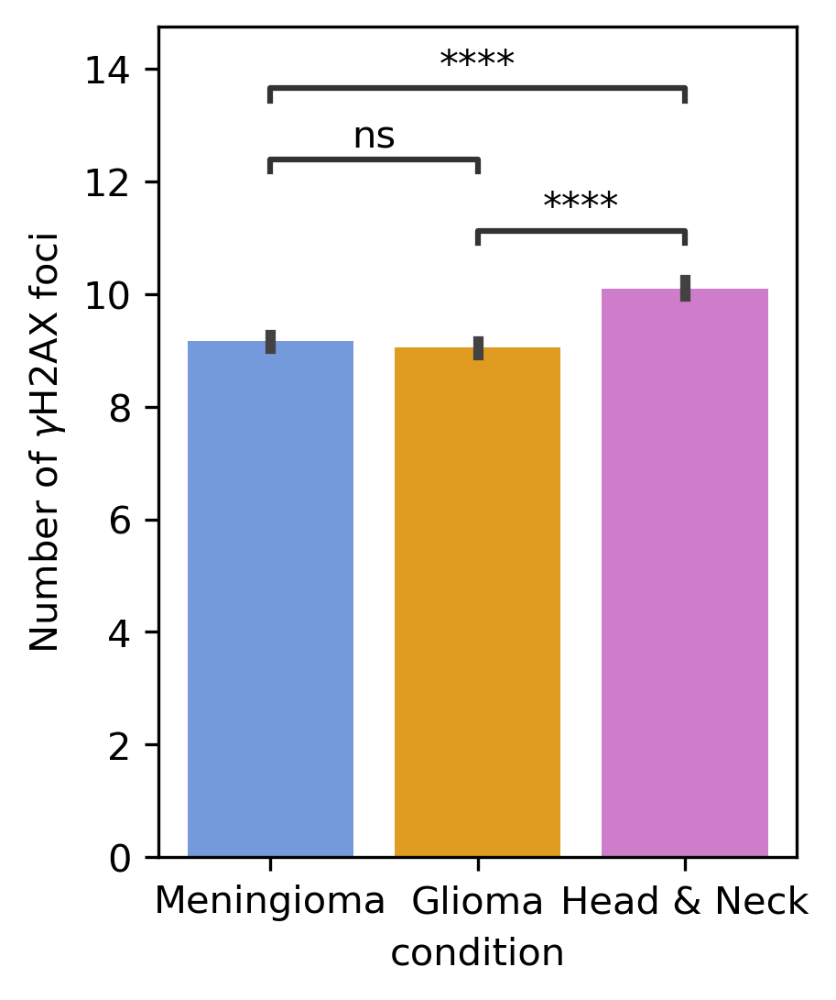

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Glioma vs. Head & Neck: t-test independent samples with Benjamini-Hochberg correction, P_val:4.066e-62 t=-1.688e+01
Meningioma vs. Glioma: t-test independent samples with Benjamini-Hochberg correction, P_val:1.714e-03 t=3.137e+00
Meningioma vs. Head & Neck: t-test independent samples with Benjamini-Hochberg correction, P_val:1.332e-44 t=-1.416e+01


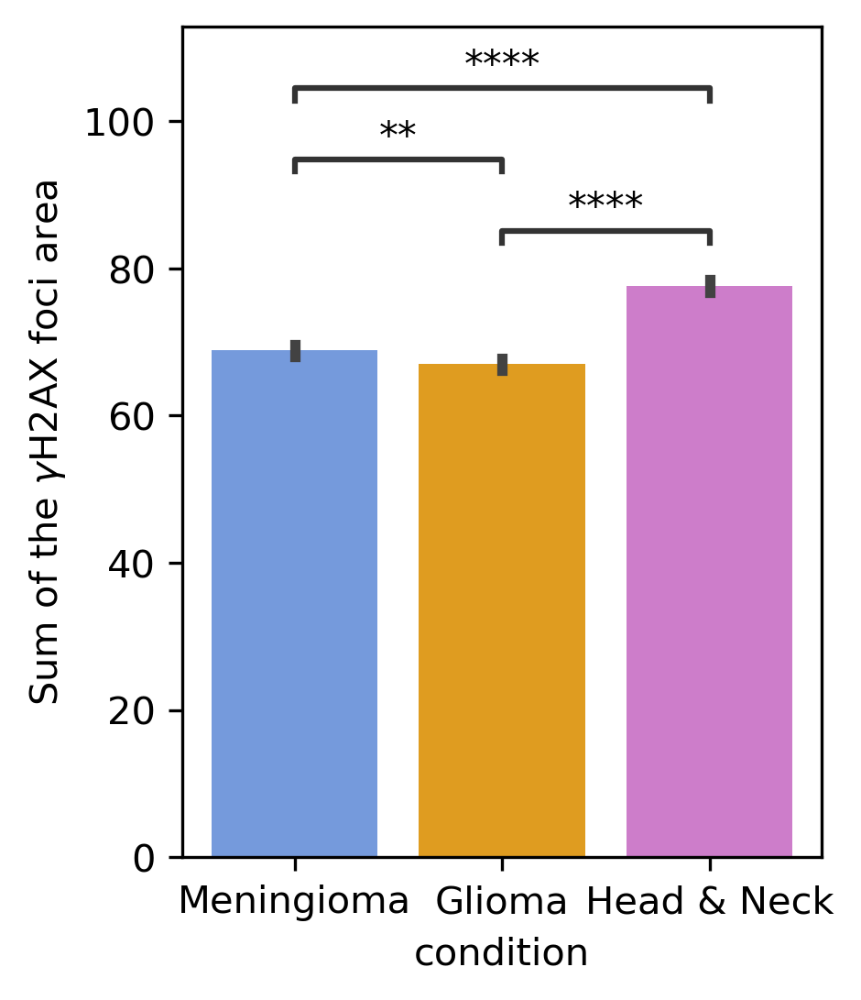

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Glioma vs. Head & Neck: t-test independent samples with Benjamini-Hochberg correction, P_val:1.529e-06 t=-4.814e+00
Meningioma vs. Glioma: t-test independent samples with Benjamini-Hochberg correction, P_val:4.947e-03 t=2.812e+00
Meningioma vs. Head & Neck: t-test independent samples with Benjamini-Hochberg correction, P_val:2.134e-01 t=-1.244e+00


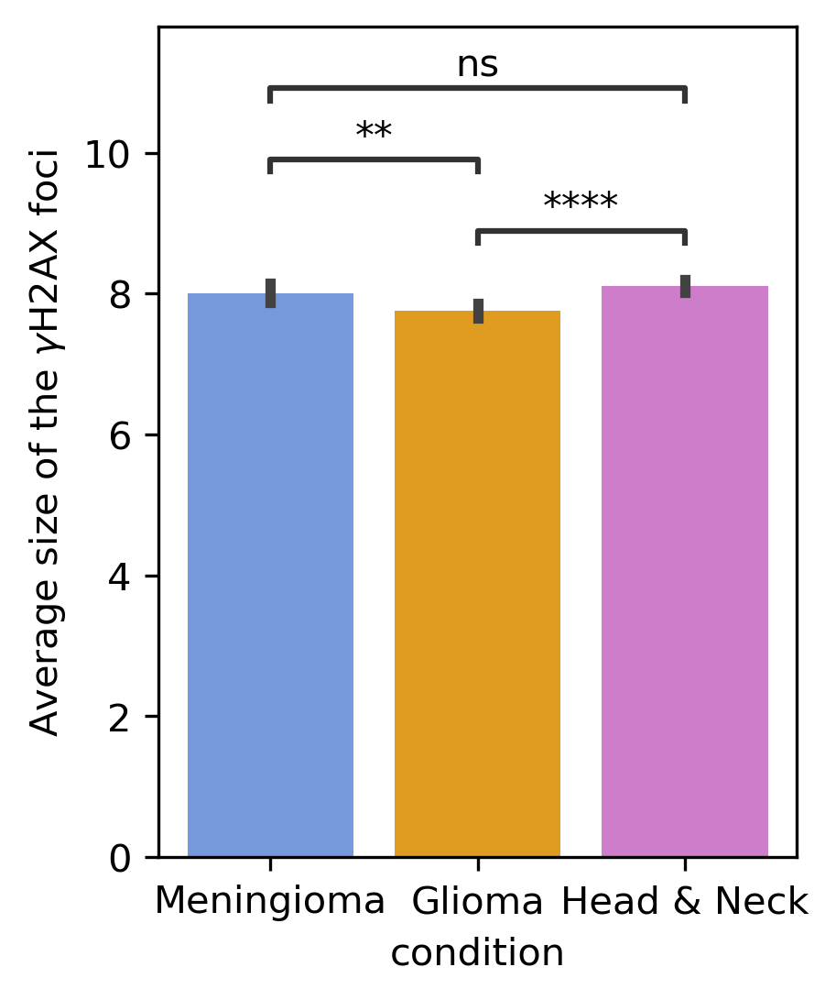

<IPython.core.display.Javascript object>

In [40]:
markers = [
    "rel_lamin_3d_int",
    "rel_gh2ax_3d_int",
    "gh2ax_foci_count",
    "gh2ax_sum_foci_area",
    "gh2ax_avg_foci_area",
]
marker_labels = [
    "Volume-normalized nuclear\nLamin A/C intensity",
    "Normalized nuclear\n" r"$\gamma$H2AX intensity",
    r"Number of $\gamma$H2AX foci",
    r"Sum of the $\gamma$H2AX foci area",
    r"Average size of the $\gamma$H2AX foci",
]
plot_cancer_type_markers_dist(
    data,
    markers,
    marker_labels,
    quantiles=None,
    cut=0,
    plot_type="bar",
    palette=color_palette,
    figsize=[3, 4],
)

---

## 4. Supplemental